# Step Forward Cross Validation for Bioactivity Prediction

## Plots to show Model Performance across splits, folds and targets

In [1]:
import itertools
from itertools import combinations

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy.stats as stats
import seaborn as sns
from statannotations.Annotator import Annotator
from statsmodels.stats.multitest import multipletests

In [2]:
df = pd.read_csv('../benchmark/results/tables/results.csv')

In [44]:
sns.set_context("paper")
sns.set_style("whitegrid")
categorical_cols = ['target', 'split_type', 'fold_no', 'fingerprint', 'model']
metric_cols = [col for col in df.columns if col not in categorical_cols]

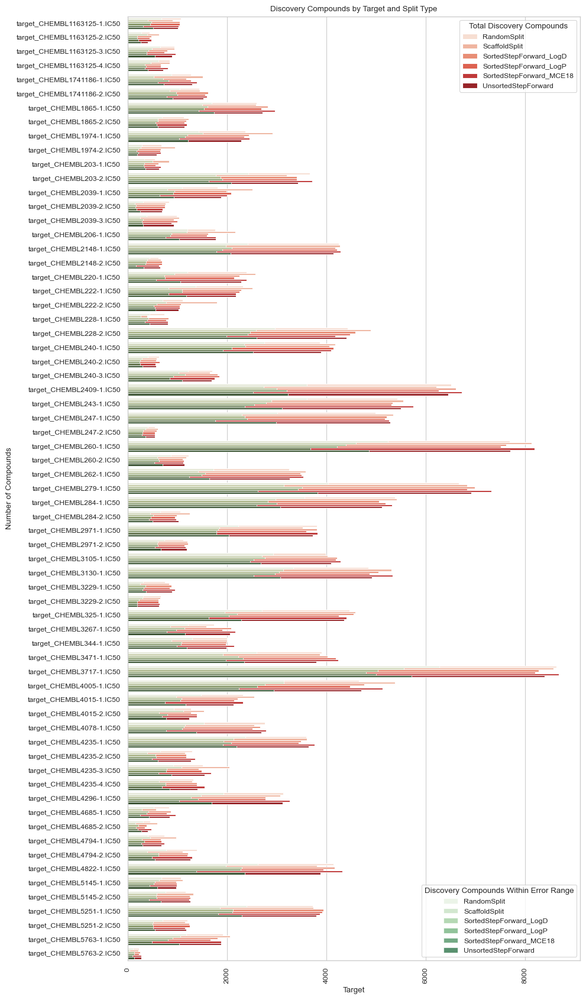

In [52]:
grouped_df = df.groupby(["target", "split_type"])[
    ["number of discovery compounds", "number of discovery compounds within error range"]
].sum().reset_index()

fig, ax = plt.subplots(figsize=(10, 17))

sns.barplot(
    data=grouped_df,
    x="number of discovery compounds",
    y="target",
    hue="split_type",
    dodge=True,
    palette="Reds",
    ax=ax
)

sns.barplot(
    data=grouped_df,
    x="number of discovery compounds within error range",
    y="target",
    hue="split_type",
    dodge=True,
    alpha=0.7,
    palette="Greens",
    ax=ax
)

ax.set_ylabel("Number of Compounds")
ax.set_xlabel("Target")
ax.set_title("Discovery Compounds by Target and Split Type")

handles1, labels1 = ax.get_legend_handles_labels()
legend1 = ax.legend(handles1[:len(labels1)//2], labels1[:len(labels1)//2], title="Total Discovery Compounds", loc="upper right")
ax.add_artist(legend1)  # Adding first legend

legend2 = ax.legend(handles1[len(labels1)//2:], labels1[len(labels1)//2:], title="Discovery Compounds Within Error Range", loc="lower right")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [ ]:
grouped_df = df.groupby(["target", "split_type"])[
    ["number of novel compounds", "number of test compounds"]
].sum().reset_index()

fig, ax = plt.subplots(figsize=(10, 17))

sns.barplot(
    data=grouped_df,
    x="number of novel compounds",
    y="target",
    hue="split_type",
    dodge=True,
    palette="Reds",
    ax=ax
)

sns.barplot(
    data=grouped_df,
    x="number of test compounds",
    y="target",
    hue="split_type",
    dodge=True,
    alpha=0.7,
    palette="Greens",
    ax=ax
)

ax.set_ylabel("Number of Compounds")
ax.set_xlabel("Target")
ax.set_title("Novel Compounds by Target and Split Type")

handles1, labels1 = ax.get_legend_handles_labels()
legend1 = ax.legend(handles1[:len(labels1)//2], labels1[:len(labels1)//2], title="Total Novel Compounds", loc="upper right")
ax.add_artist(legend1)  # Adding first legend

legend2 = ax.legend(handles1[len(labels1)//2:], labels1[len(labels1)//2:], title="Test Compounds", loc="lower right")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

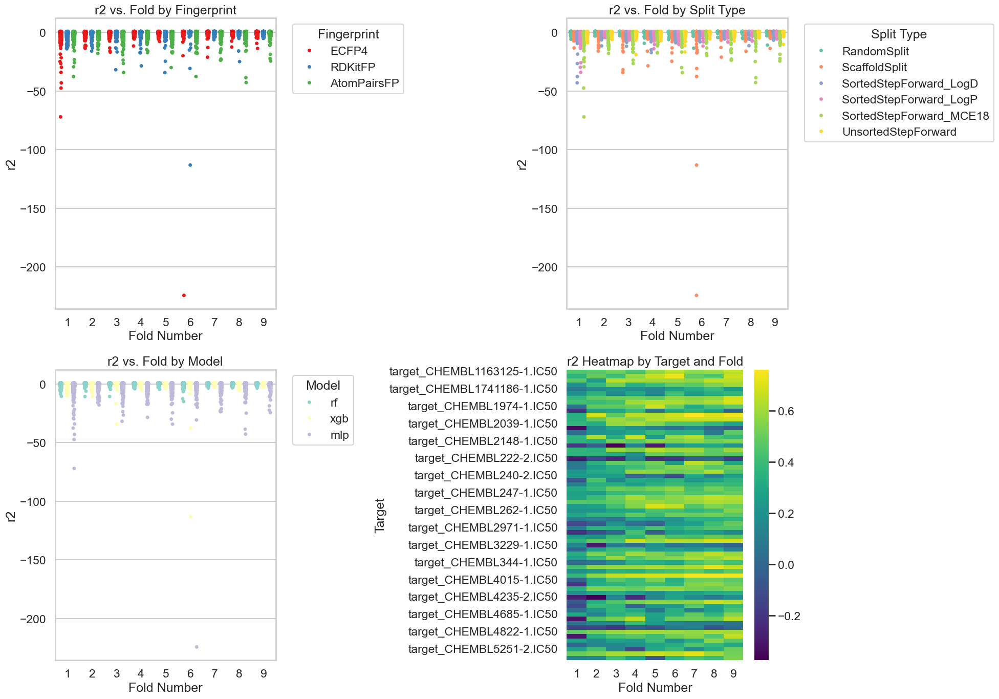

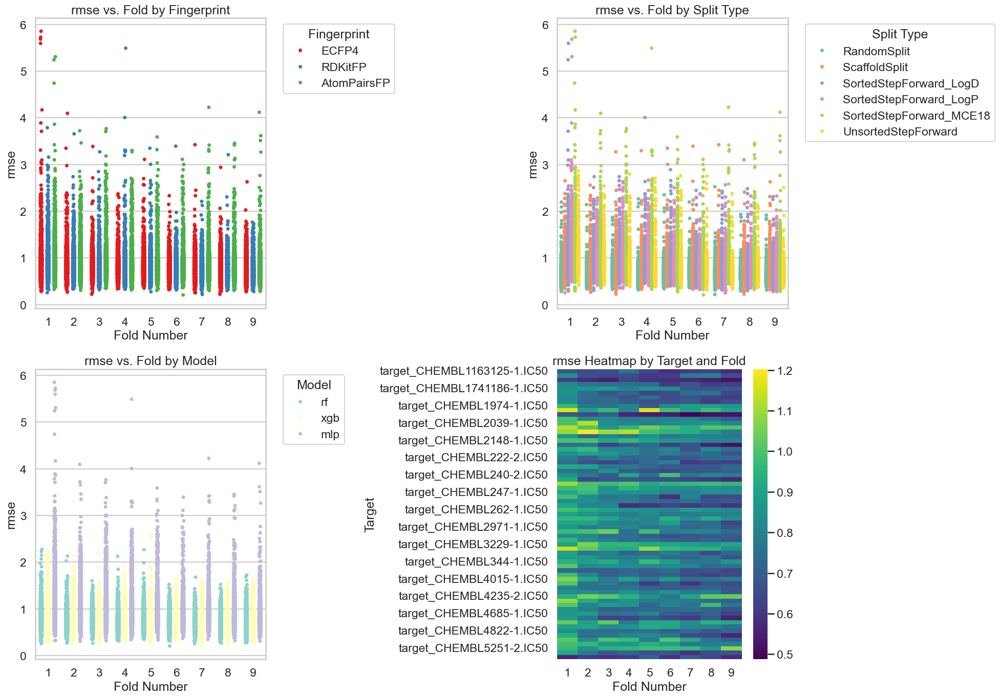

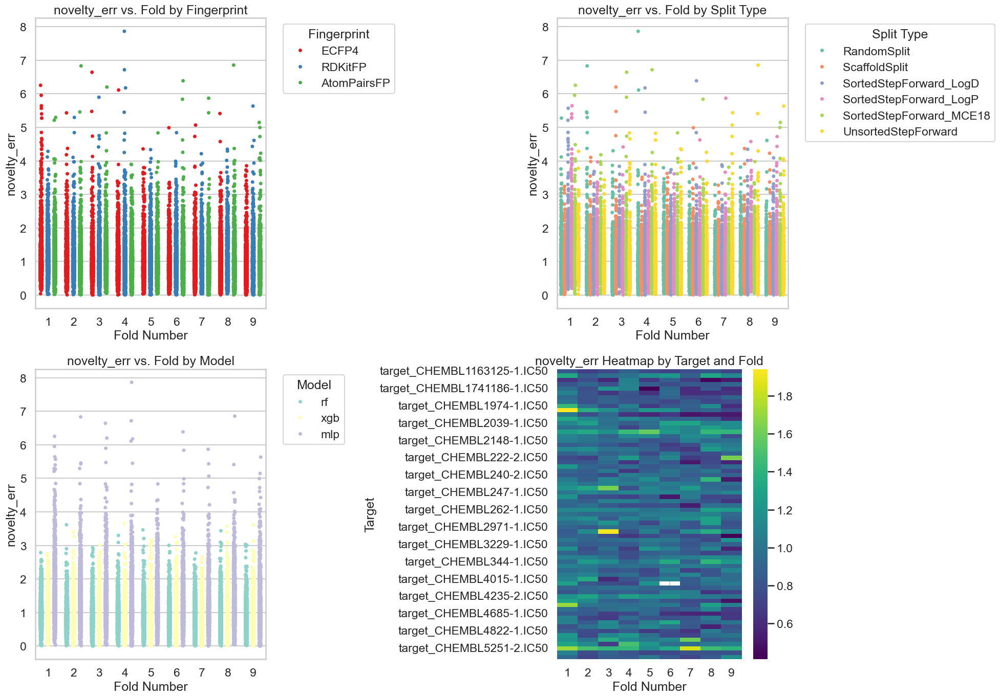

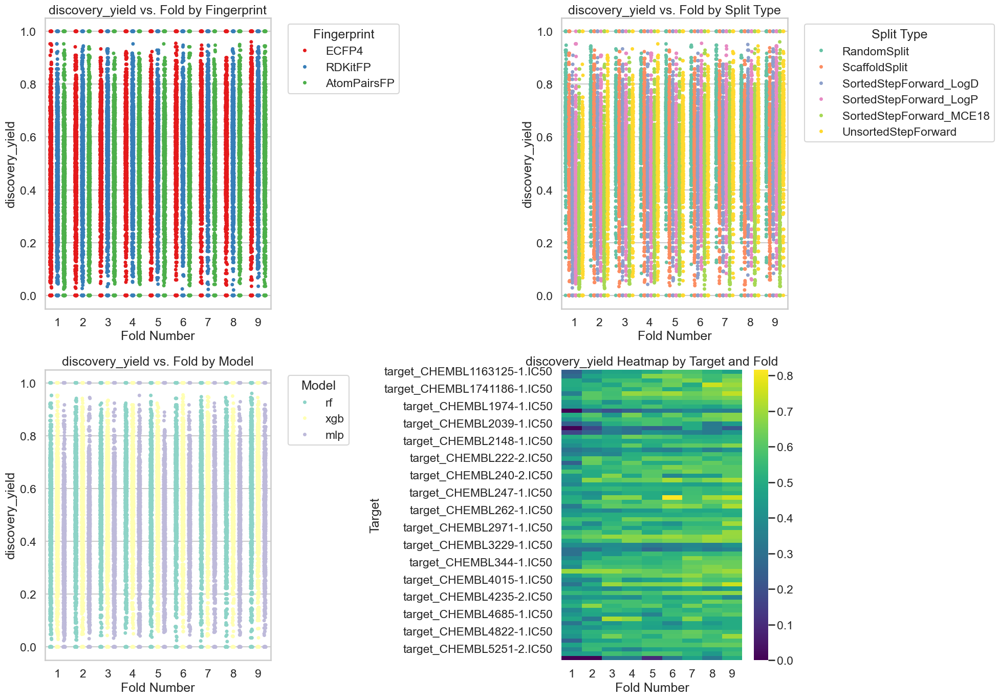

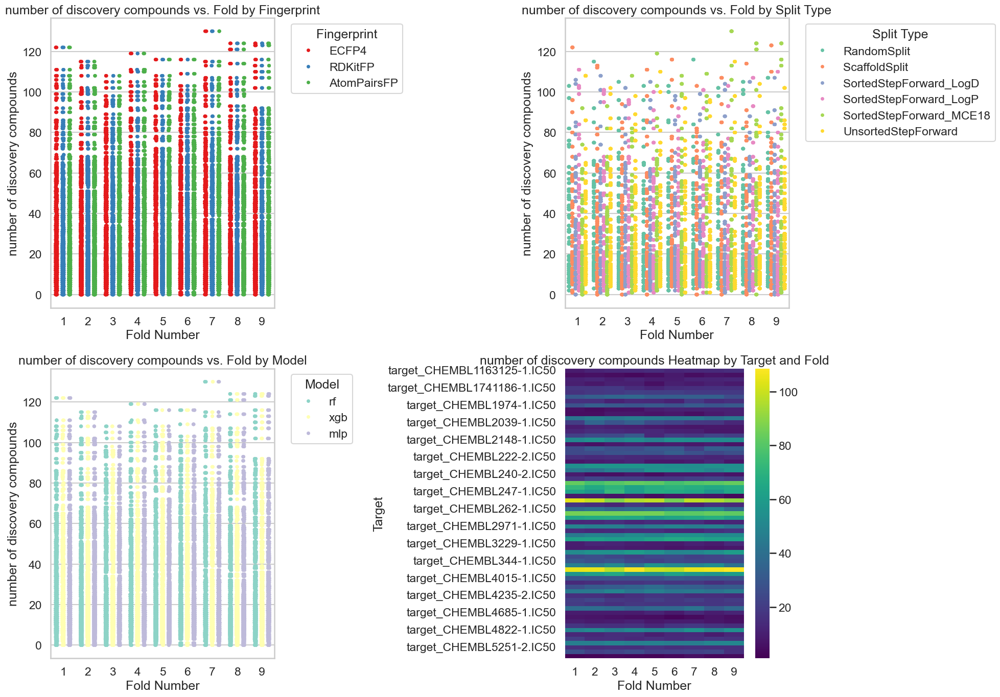

In [ ]:
for metric in metric_cols:
    fig, axes = plt.subplots(2, 2, figsize=(20, 14))

    sns.stripplot(data=df, x='fold_no', y=metric, hue='fingerprint',
                  dodge=True, jitter=True, ax=axes[0, 0], palette='Set1')
    axes[0, 0].set_title(f'{metric} vs. Fold by Fingerprint')
    axes[0, 0].set_xlabel('Fold Number')
    axes[0, 0].set_ylabel(metric)
    axes[0, 0].legend(title='Fingerprint', bbox_to_anchor=(1.05, 1), loc='upper left')

    sns.stripplot(data=df, x='fold_no', y=metric, hue='split_type',
                  dodge=True, jitter=True, ax=axes[0, 1], palette='Set2')
    axes[0, 1].set_title(f'{metric} vs. Fold by Split Type')
    axes[0, 1].set_xlabel('Fold Number')
    axes[0, 1].set_ylabel(metric)
    axes[0, 1].legend(title='Split Type', bbox_to_anchor=(1.05, 1), loc='upper left')

    sns.stripplot(data=df, x='fold_no', y=metric, hue='model',
                  dodge=True, jitter=True, ax=axes[1, 0], palette='Set3')
    axes[1, 0].set_title(f'{metric} vs. Fold by Model')
    axes[1, 0].set_xlabel('Fold Number')
    axes[1, 0].set_ylabel(metric)
    axes[1, 0].legend(title='Model', bbox_to_anchor=(1.05, 1), loc='upper left')

    
    # To avoid a cluttered legend with 67 targets, we aggregate (using median) per target & fold.
    pivot_table = df.groupby(['target', 'fold_no'])[metric].median().unstack()
    sns.heatmap(pivot_table, ax=axes[1, 1], cmap='viridis')
    axes[1, 1].set_title(f'{metric} Heatmap by Target and Fold')
    axes[1, 1].set_xlabel('Fold Number')
    axes[1, 1].set_ylabel('Target')

    plt.tight_layout()
    plt.show()

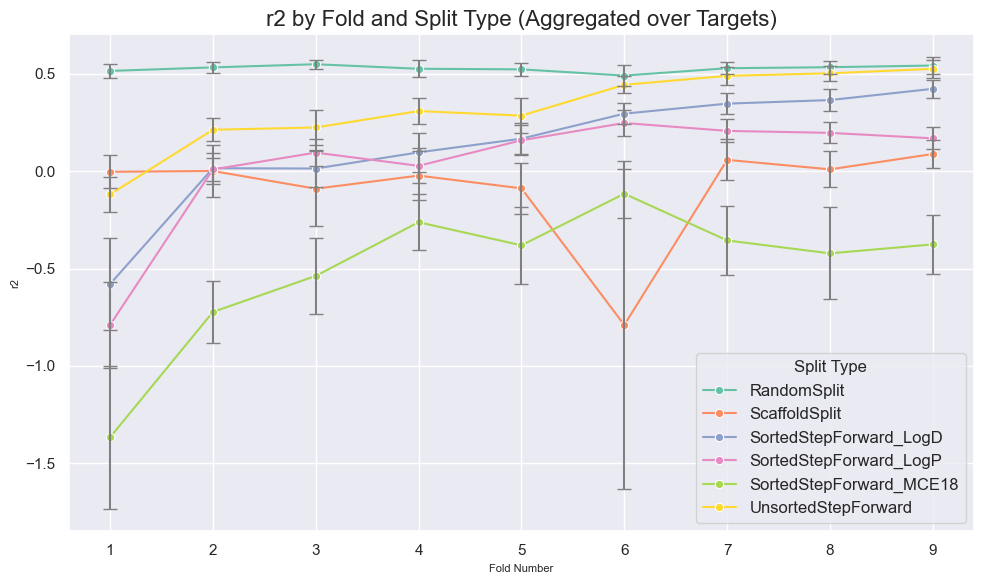

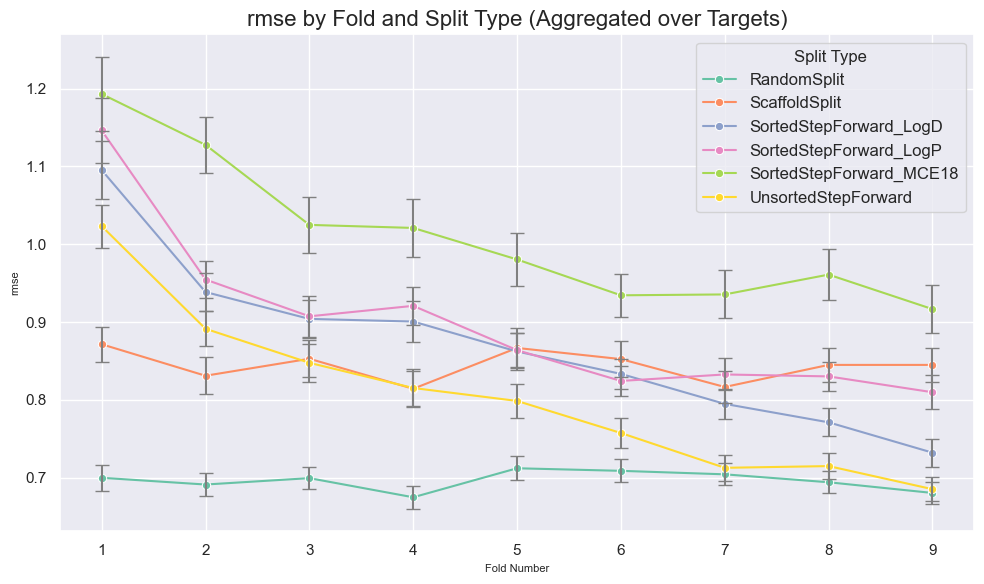

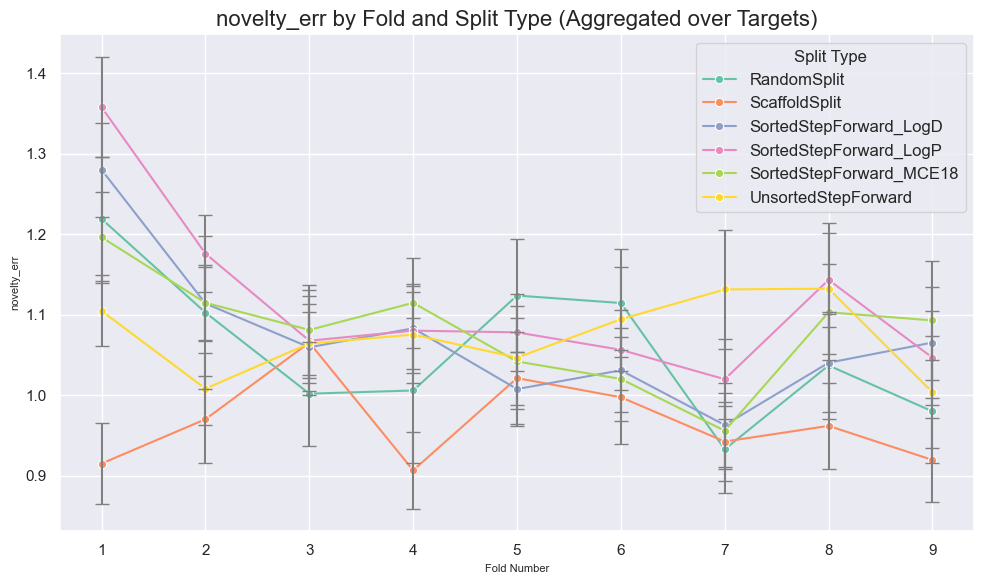

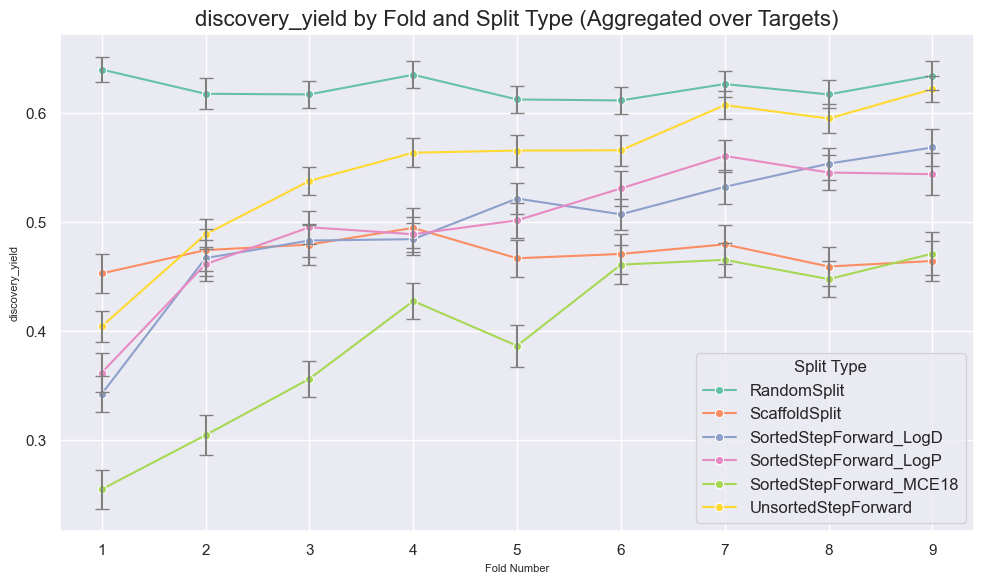

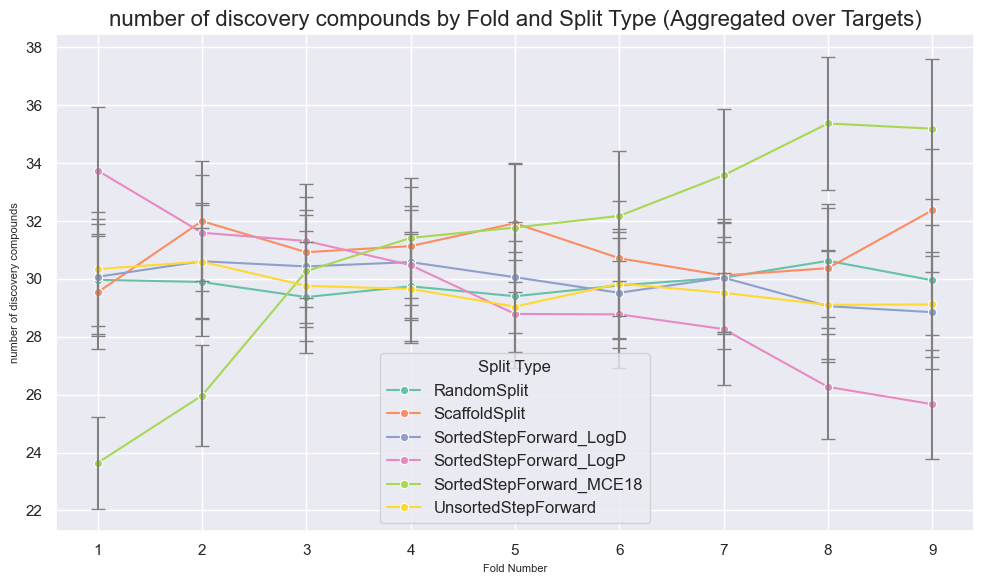

...

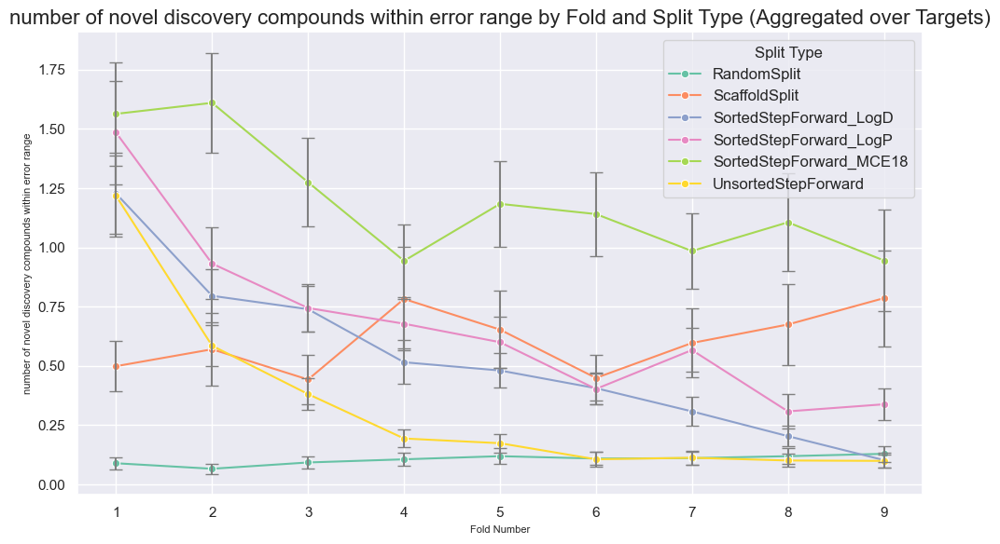

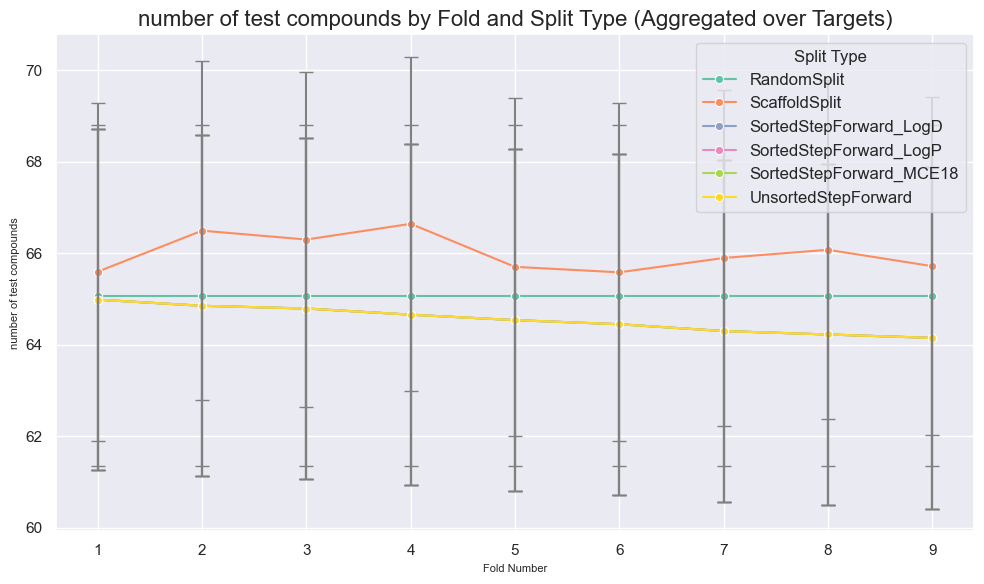

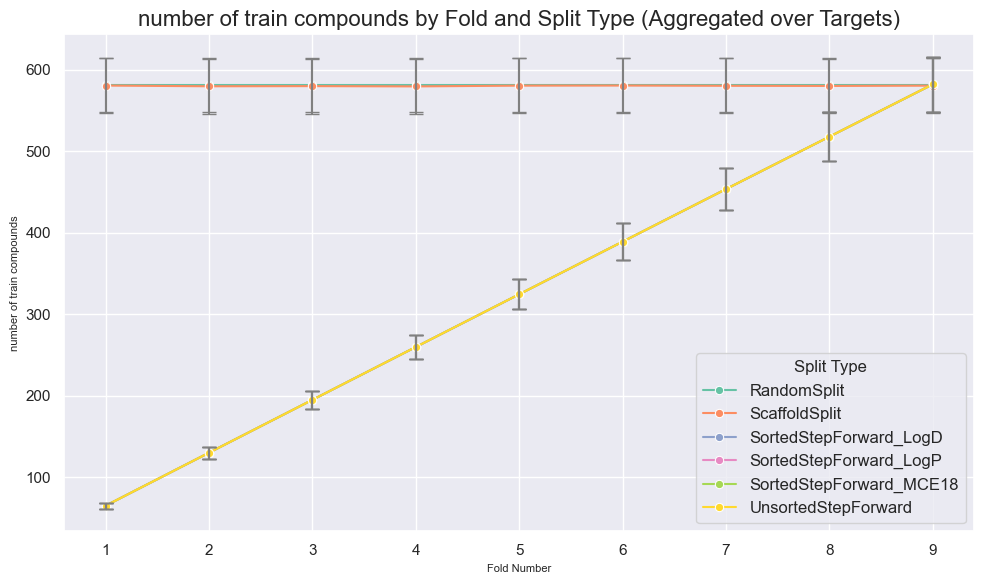

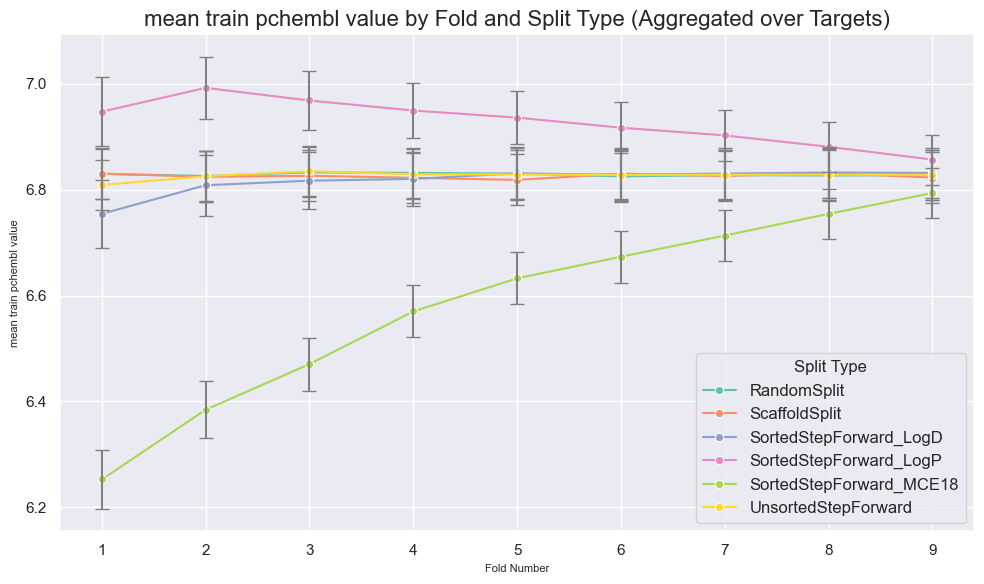

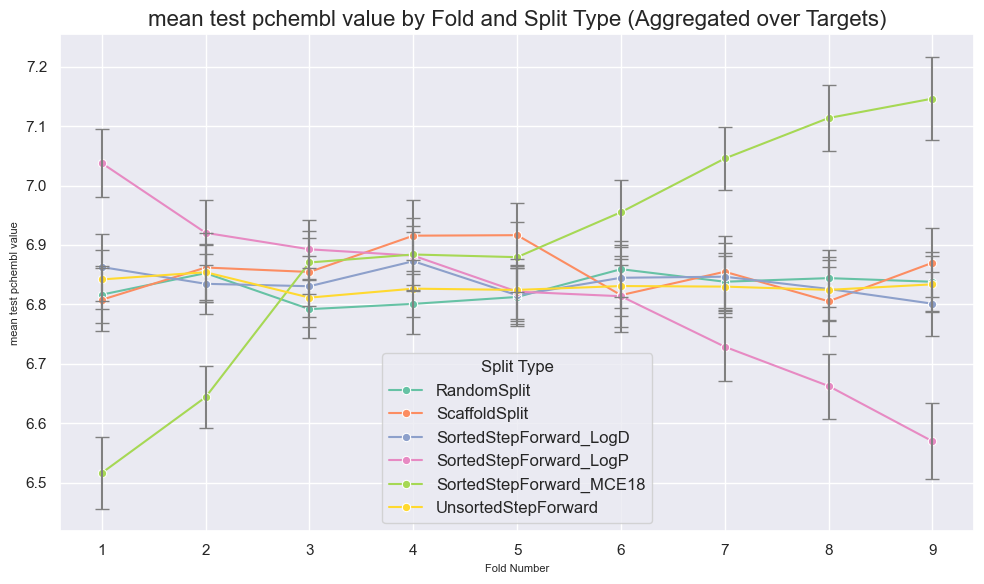

In [17]:
# metric = 'number of novel discovery compounds within error range'
for metric in metric_cols:
    agg_df = df.groupby(['fold_no', 'split_type'])[metric].agg(['mean', 'std', 'count']).reset_index()
    agg_df['se'] = agg_df['std'] / np.sqrt(agg_df['count'])
    agg_df['ci'] = 1.96 * agg_df['se']  # 95% confidence interval

    plt.figure(figsize=(10, 6))
    sns.lineplot(data=agg_df, x='fold_no', y='mean', hue='split_type', marker='o', palette='Set2')
    # Manually add error bars
    for split in agg_df['split_type'].unique():
        sub = agg_df[agg_df['split_type'] == split]
        plt.errorbar(sub['fold_no'], sub['mean'], yerr=sub['ci'], fmt='none', capsize=5, color='gray')
    plt.title(f'{metric} by Fold and Split Type (Aggregated over Targets)', fontsize=16)
    plt.xlabel('Fold Number', fontsize=8)
    plt.ylabel(metric, fontsize=8)
    plt.legend(title='Split Type', fontsize=12, title_fontsize=12)
    plt.tight_layout()
    plt.show()

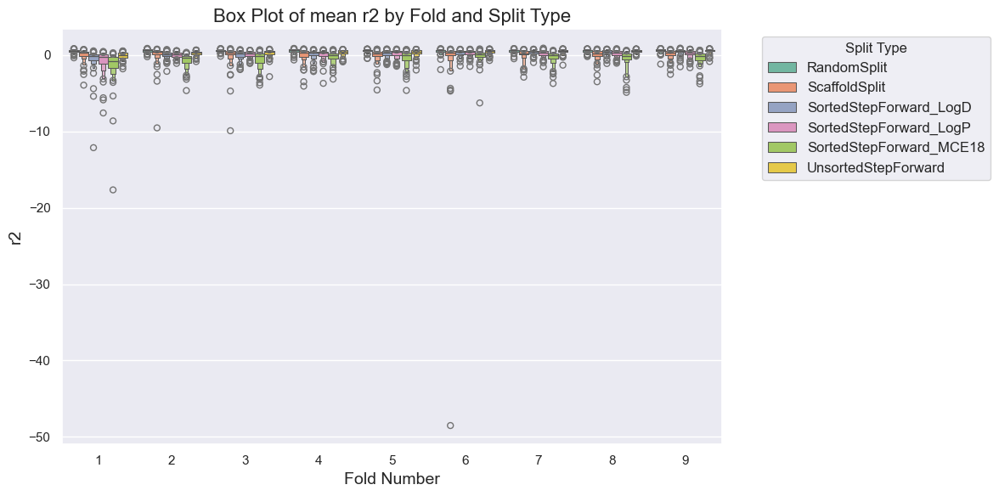

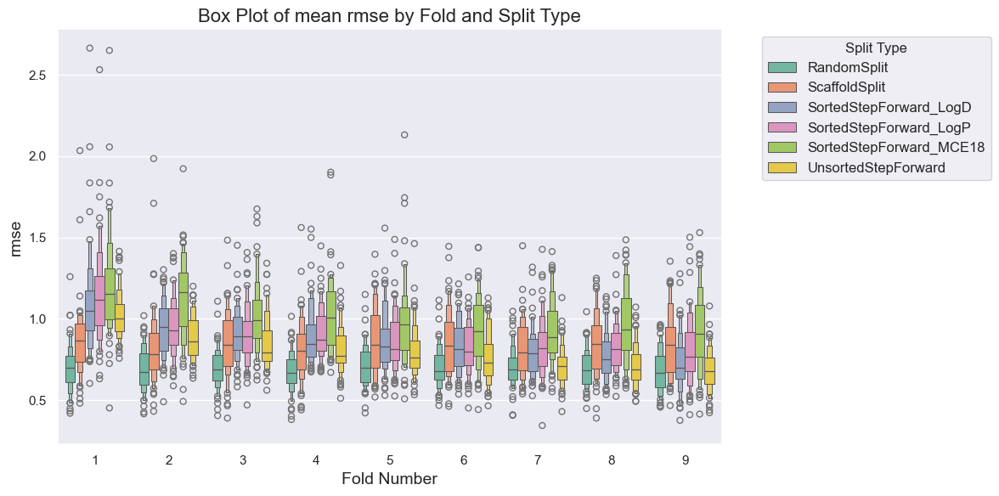

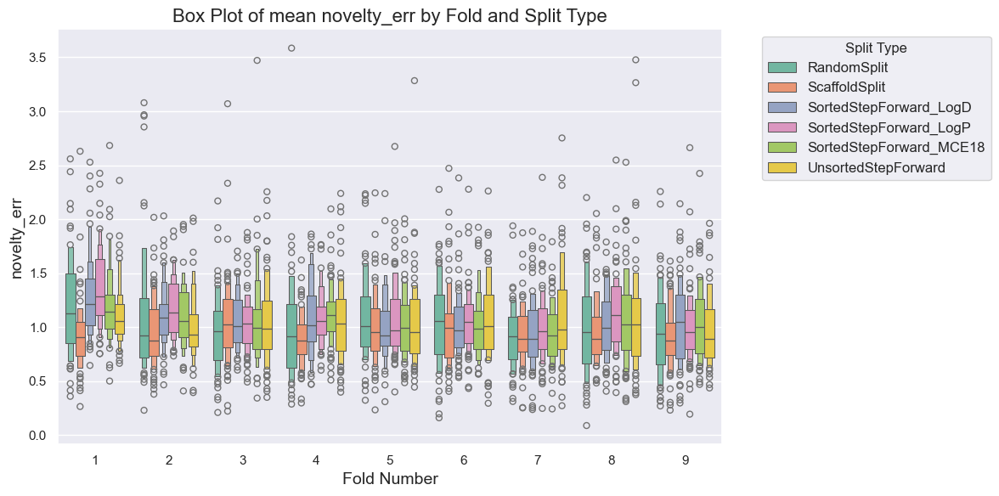

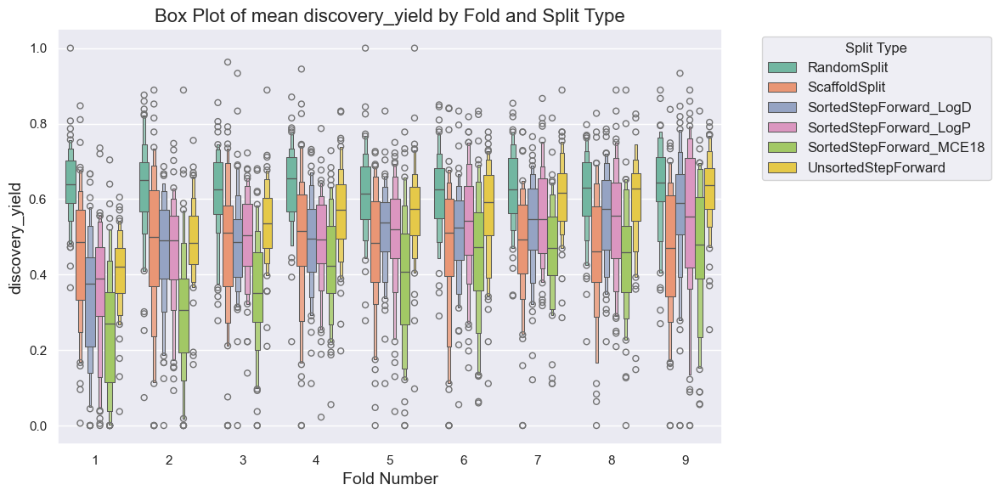

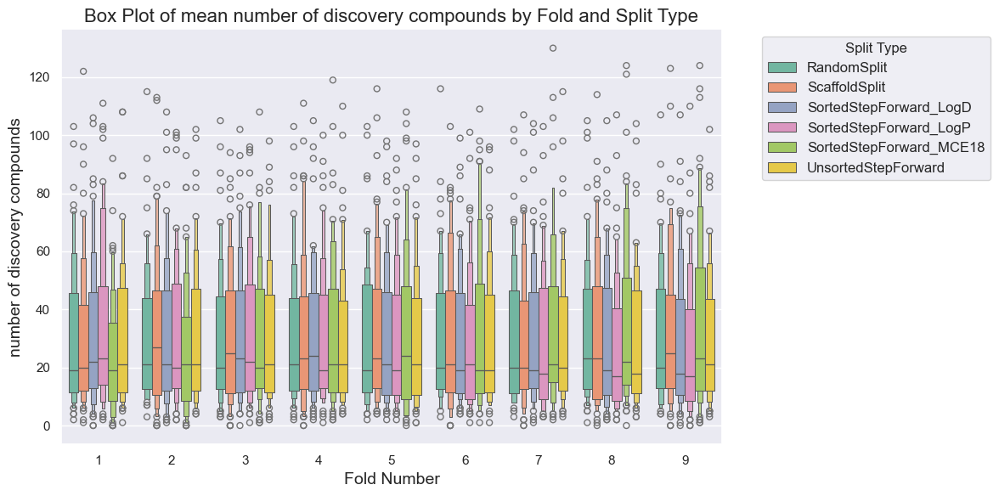

...

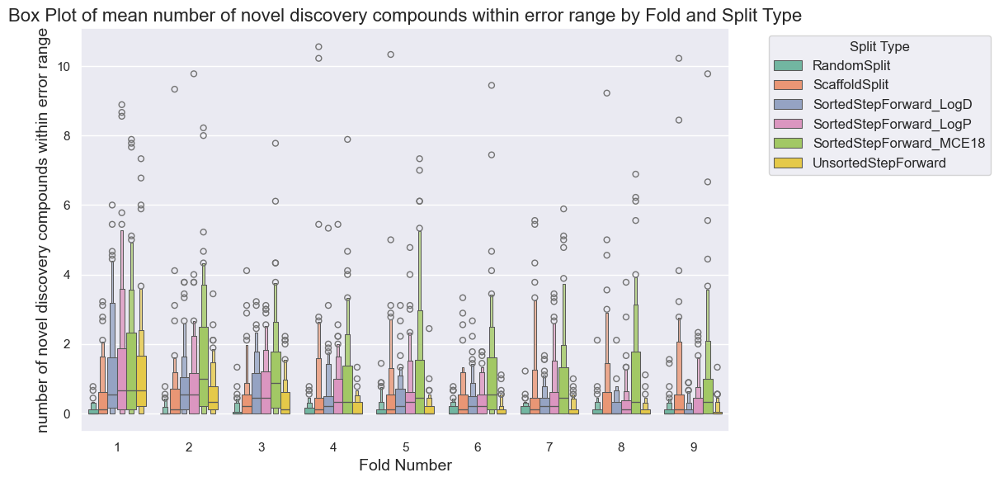

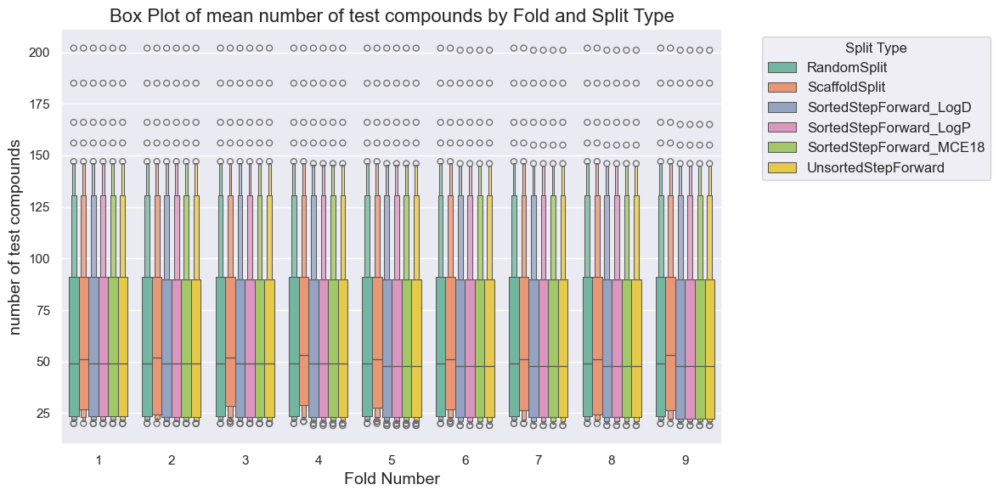

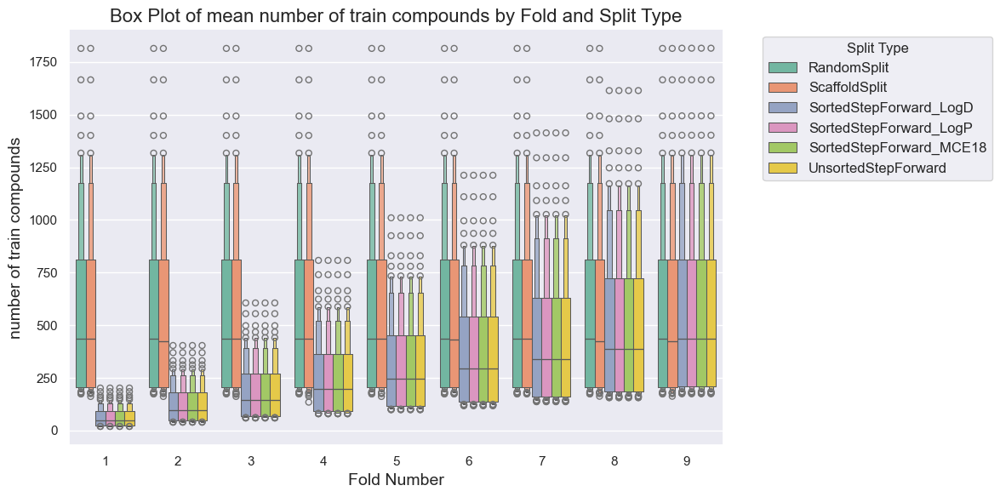

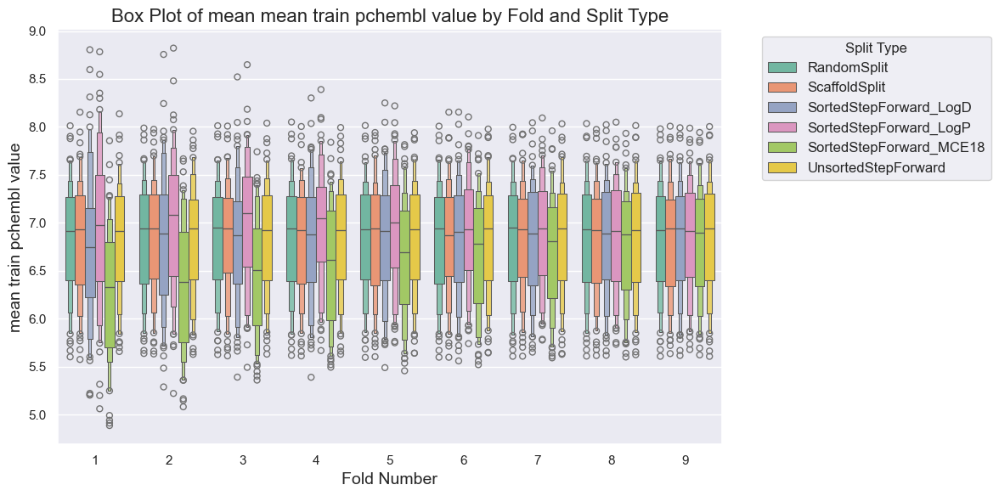

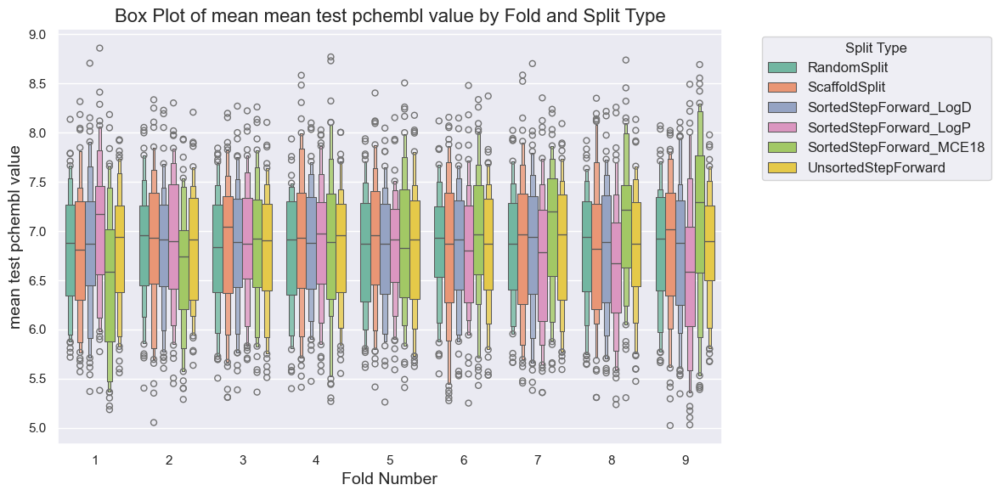

In [18]:
for metric in metric_cols:
    agg_targets = df.groupby(['target', 'fold_no', 'split_type'])[metric].mean().reset_index()

    plt.figure(figsize=(12, 6))
    sns.boxenplot(data=agg_targets, x='fold_no', y=metric, hue='split_type', palette='Set2')
    plt.title(f'Box Plot of mean {metric} by Fold and Split Type', fontsize=16)
    plt.xlabel('Fold Number', fontsize=14)
    plt.ylabel(metric, fontsize=14)
    plt.legend(title='Split Type', fontsize=12, title_fontsize=12, bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

In [25]:
df

,target,split_type,fold_no,fingerprint,model,r2,rmse,novelty_err,discovery_yield,number of discovery compounds,number of discovery compounds within error range,number of novel compounds,number of novel discovery compounds,number of novel discovery compounds within error range,number of test compounds,number of train compounds,mean train pchembl value,mean test pchembl value
0,target_CHEMBL220-1.IC50,RandomSplit,1,ECFP4,rf,0.790732,0.539328,0.199640,0.512821,39,20,2,0,0,120,1080,6.075028,6.383917
1,target_CHEMBL220-1.IC50,RandomSplit,1,ECFP4,xgb,0.754191,0.584522,0.384919,0.512821,39,20,2,0,0,120,1080,6.075028,6.383917
2,target_CHEMBL220-1.IC50,RandomSplit,1,ECFP4,mlp,0.732577,0.609678,1.408215,0.538462,39,21,2,0,0,120,1080,6.075028,6.383917
3,target_CHEMBL220-1.IC50,RandomSplit,2,ECFP4,rf,0.827070,0.518001,0.441600,0.655172,29,19,1,0,0,120,1080,6.100213,6.157250
4,target_CHEMBL220-1.IC50,RandomSplit,2,ECFP4,xgb,0.799422,0.557874,0.902332,0.517241,29,15,1,0,0,120,1080,6.100213,6.157250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32557,target_CHEMBL284-1.IC50,UnsortedStepForward,8,AtomPairsFP,xgb,0.297308,1.004376,2.080738,0.596491,57,34,3,2,0,99,799,7.272403,7.117879
32558,target_CHEMBL284-1.IC50,UnsortedStepForward,8,AtomPairsFP,mlp,0.309793,0.995413,1.258589,0.421053,57,24,3,2,0,99,799,7.272403,7.117879
32559,target_CHEMBL284-1.IC50,UnsortedStepForward,9,AtomPairsFP,rf,0.487198,0.751566,1.124600,0.642857,56,36,2,1,1,99,898,7.255367,7.262828
32560,target_CHEMBL284-1.IC50,UnsortedStepForward,9,AtomPairsFP,xgb,0.452653,0.776468,0.809821,0.642857,56,36,2,1,1,99,898,7.255367,7.262828


In [34]:
d = {}
for split_type in df.split_type.unique():
    d[split_type] = df.loc[df['split_type']==split_type, 'number of novel compounds'].mean()

In [35]:
dict(sorted(d.items(), key=lambda item: item[1]))

{'RandomSplit': 1.4975124378109452,
 'UnsortedStepForward': 3.7473742399115535,
 'SortedStepForward_LogD': 6.529574350469873,
 'ScaffoldSplit': 7.148148148148148,
 'SortedStepForward_LogP': 7.488114980652294,
 'SortedStepForward_MCE18': 14.635157545605306}

In [21]:
summary_df = df.groupby(['split_type'])[metric_cols].agg(['mean', 'std']).round(2)

In [22]:
summary_df.to_csv('../benchmark/results/tables/mean_splitwise.csv', index=False)

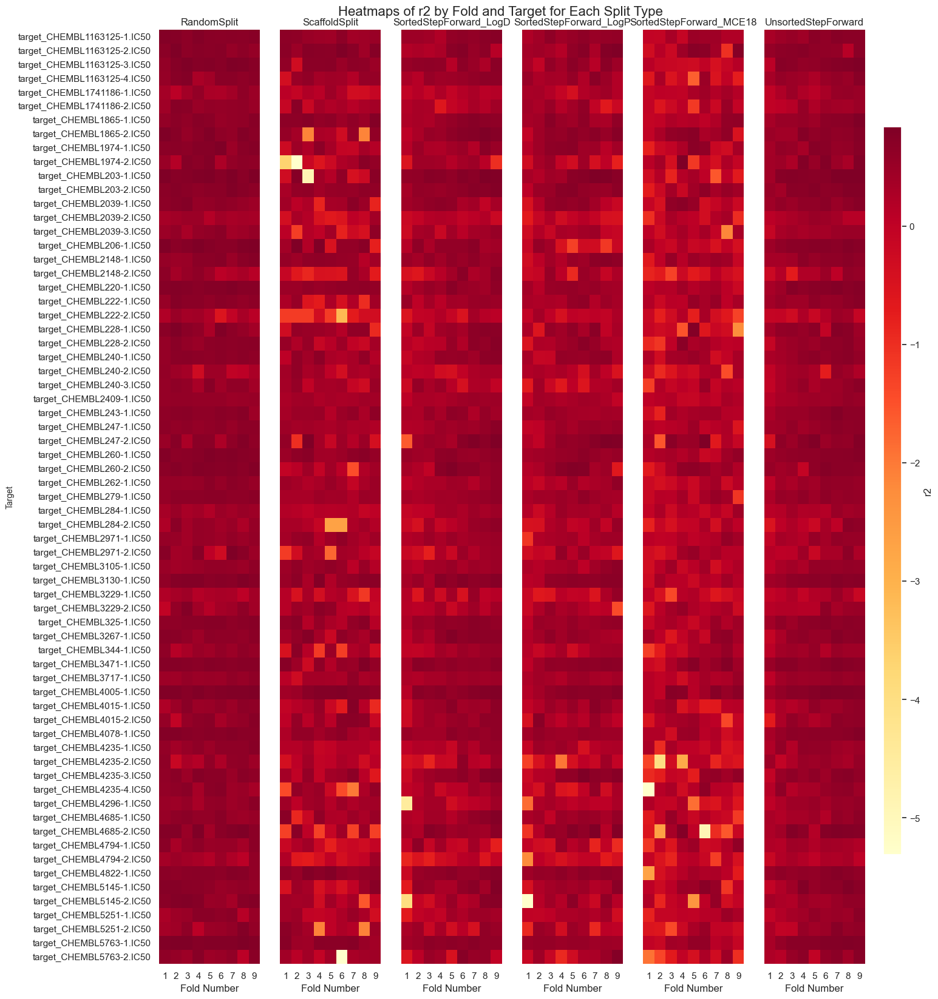

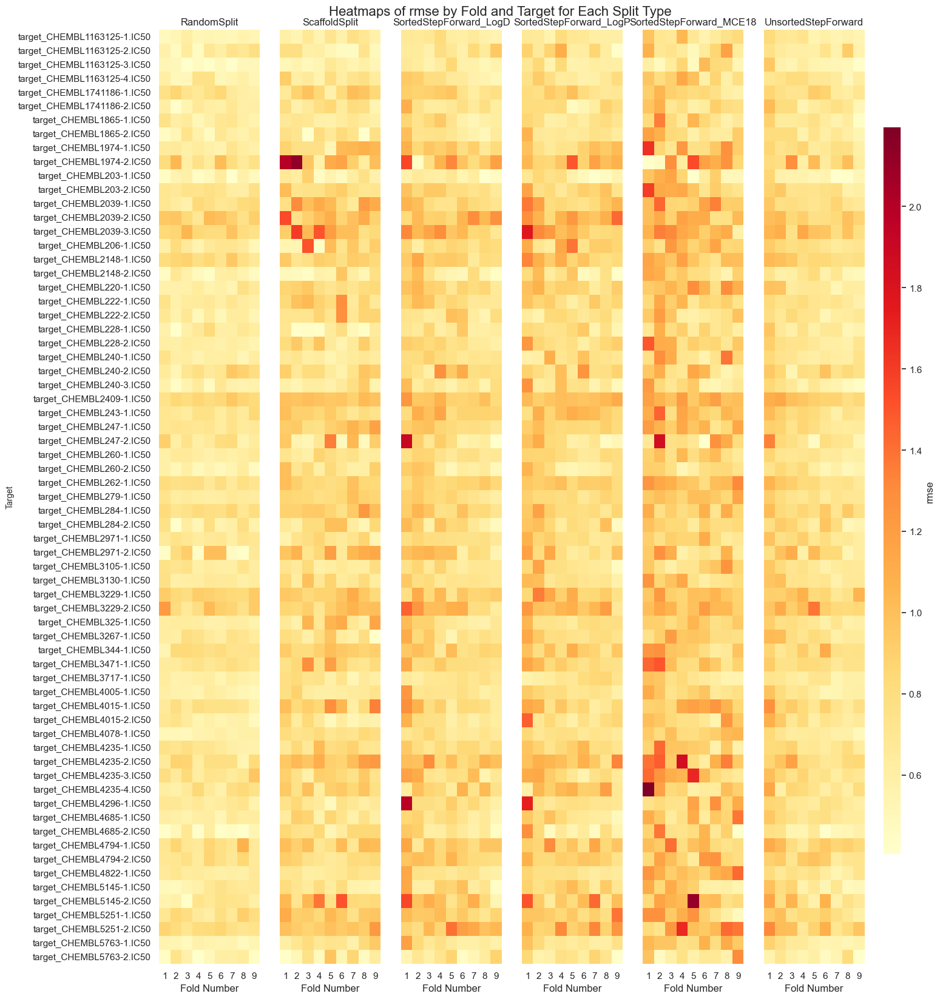

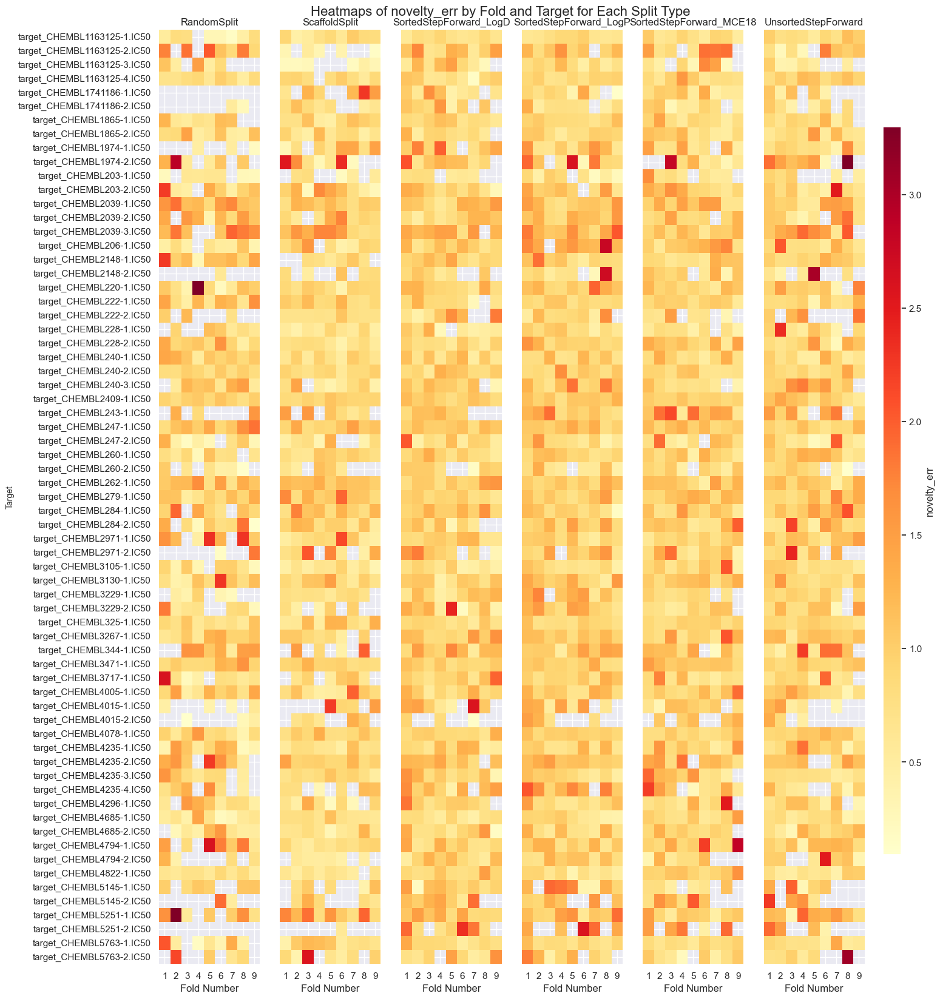

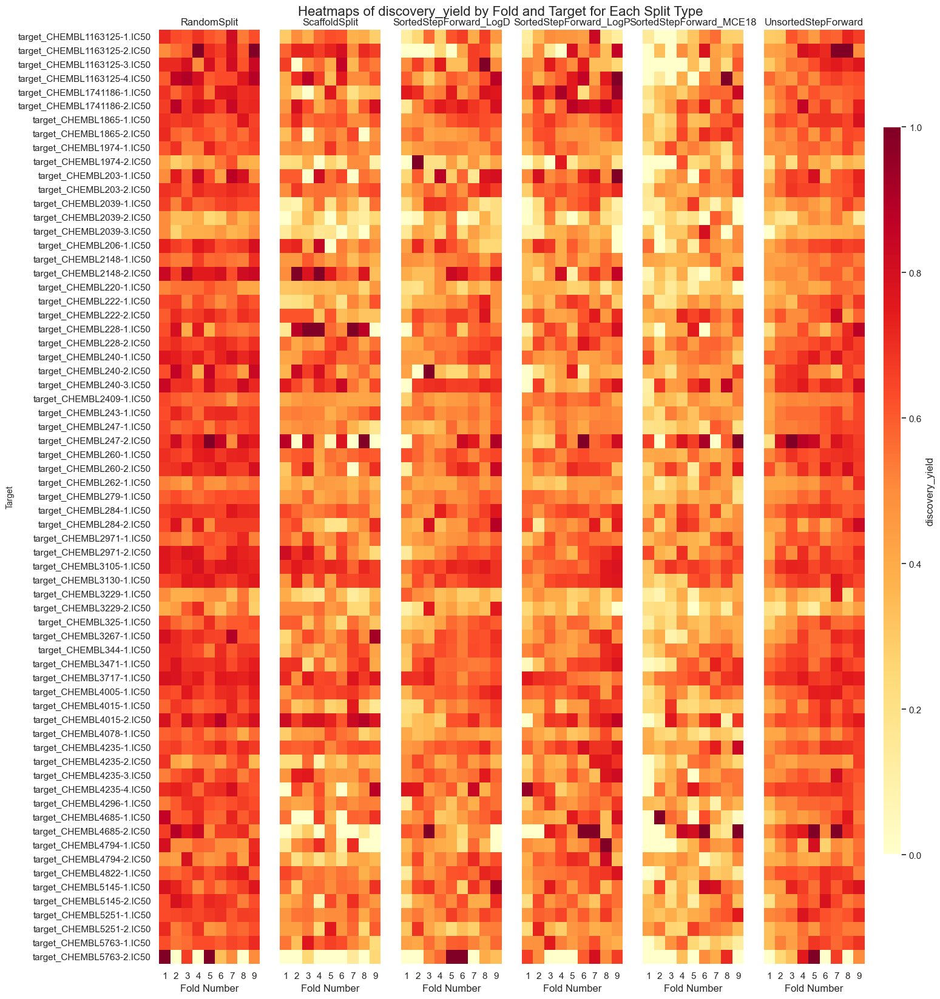

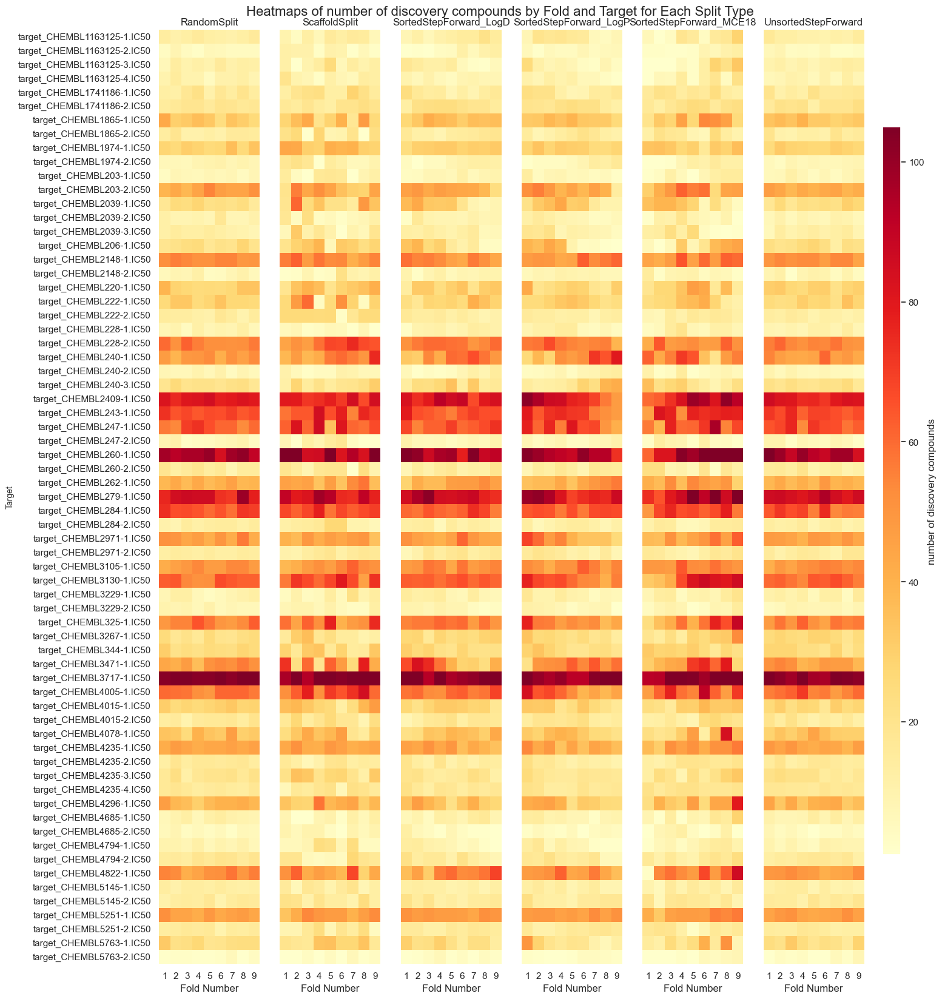

...

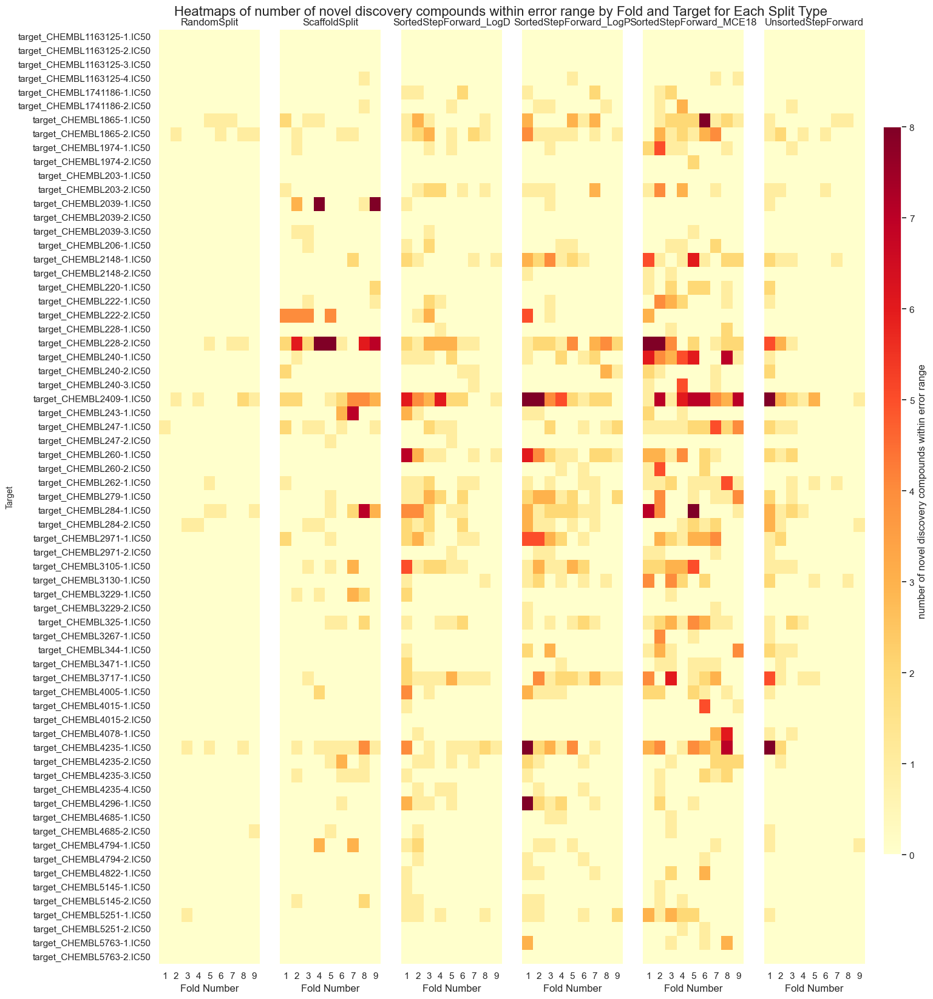

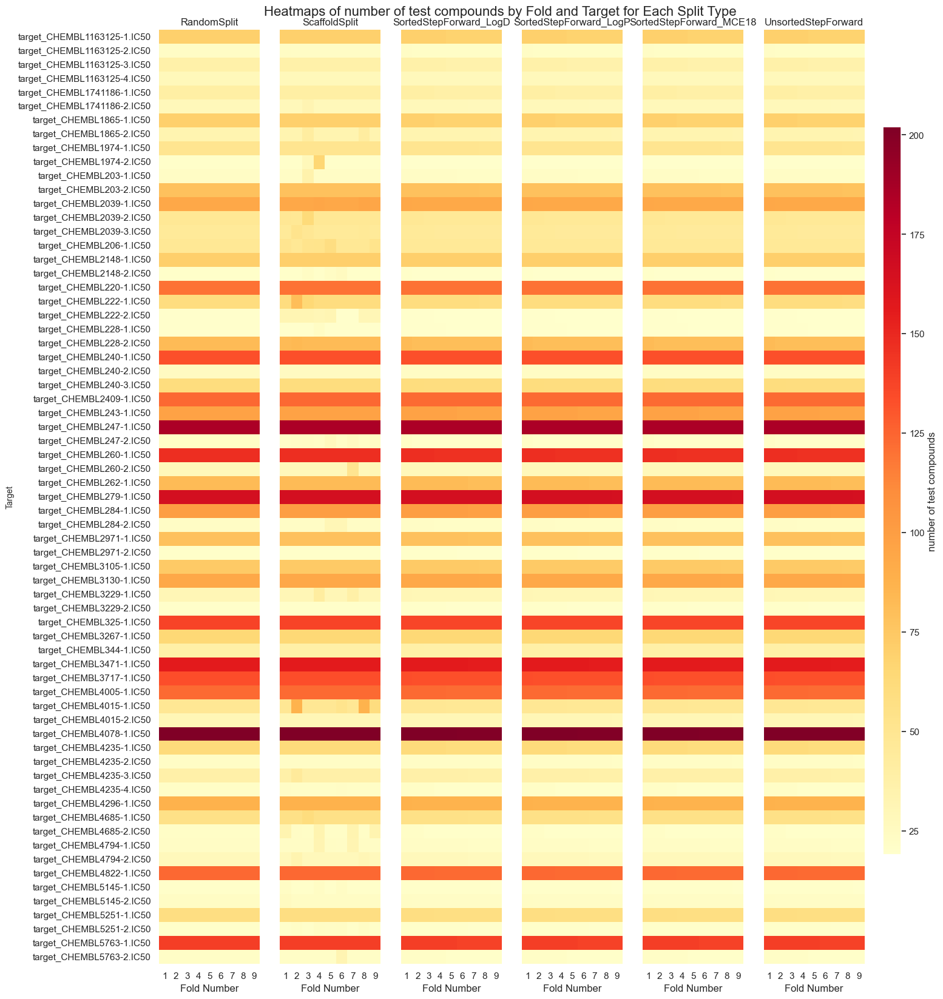

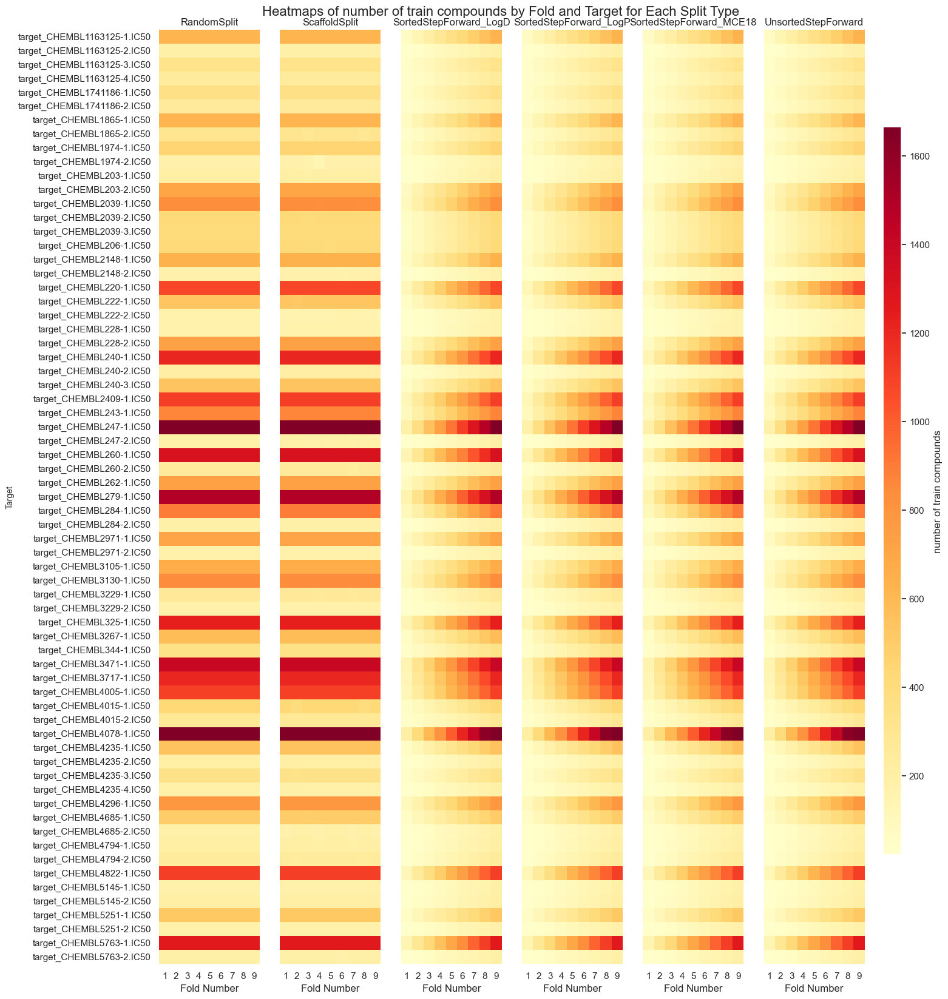

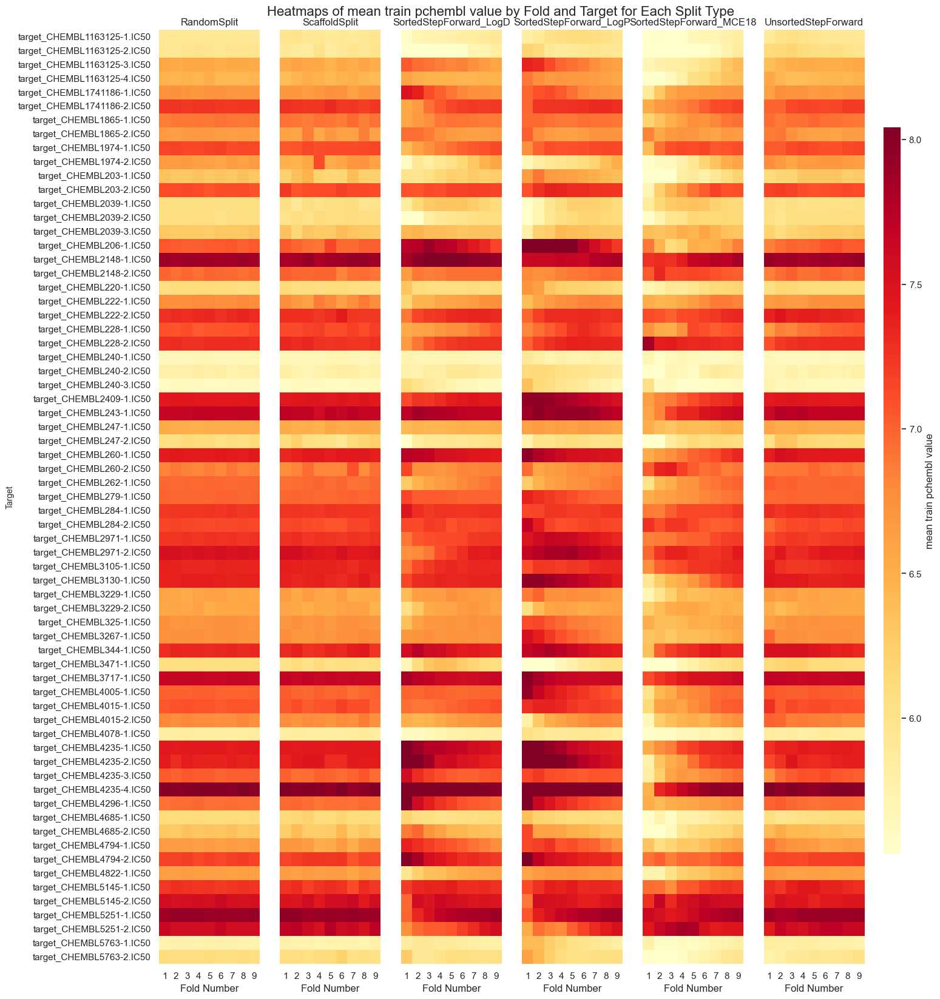

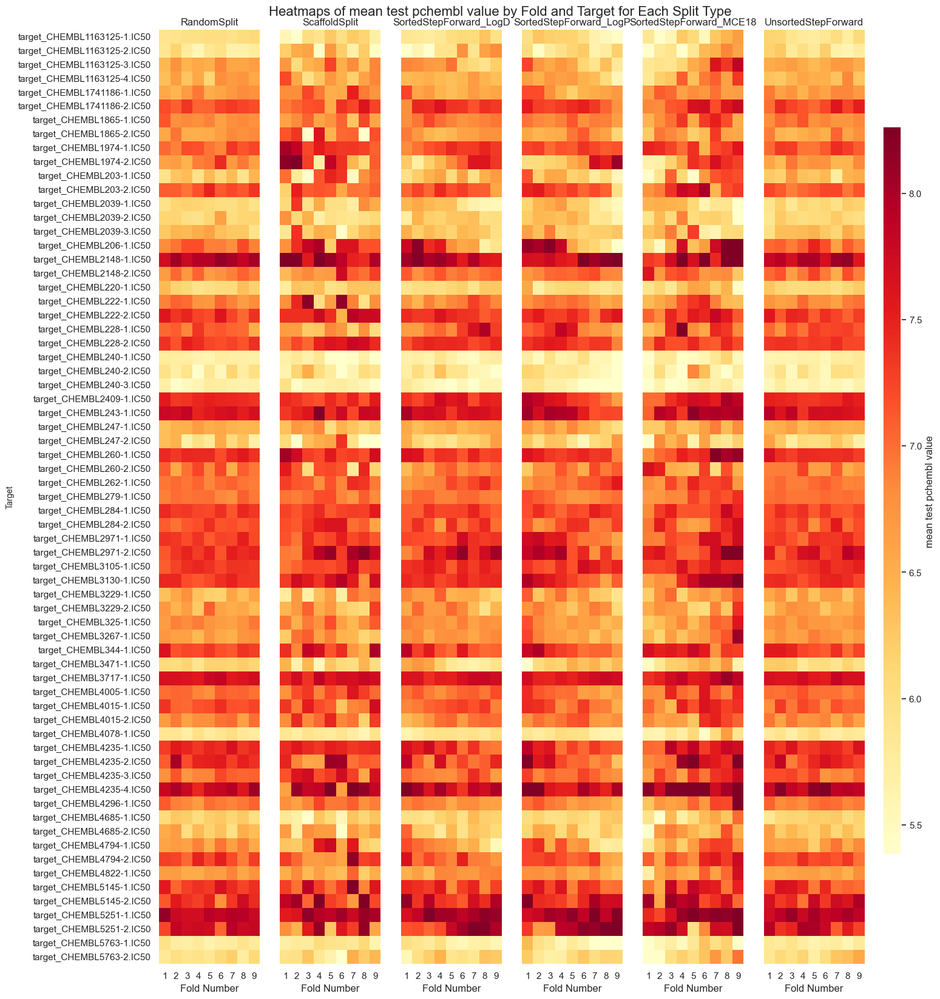

In [23]:
# cmap = sns.color_palette("Greys", as_cmap=True)
cmap = sns.color_palette("YlOrRd", as_cmap=True)
sns.set(font_scale = 1)


for metric in metric_cols:
    split_types = df['split_type'].unique()
    
    fig, axes = plt.subplots(1, len(split_types), figsize=(15,20), sharey=True)
    vmin, vmax = df[metric].min(), df[metric].max()

    q_low, q_high = df[metric].quantile([0.01, 0.99])  # 1% and 99% percentiles
    vmin, vmax = q_low, q_high  # Use percentile range to remove extreme values

    # Plot heatmaps
    for ax, st in zip(axes, split_types):
        pivot = df[df['split_type'] == st].groupby(['target', 'fold_no'])[metric].median().unstack()
        
        sns.heatmap(
            pivot, ax=ax, cmap=cmap, cbar=False, vmin=vmin, vmax=vmax
        )
        
        ax.set_title(st, fontsize=12)
        ax.set_xlabel('Fold Number', fontsize=12)
        ax.set_ylabel('Target' if ax == axes[0] else "", fontsize=10)  # Only first plot gets ylabel

    # Create a single colorbar
    cbar_ax = fig.add_axes([0.92, 0.2, 0.02, 0.6])  # Position the colorbar better
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
    cbar = fig.colorbar(sm, cax=cbar_ax)
    cbar.set_label(metric, fontsize=12)

    plt.suptitle(f'Heatmaps of {metric} by Fold and Target for Each Split Type', fontsize=16, y=0.90)
    # plt.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust layout to fit colorbar
    plt.savefig(f"../benchmark/results/figures/{metric}_heatmaps_per_fold.svg")
    plt.show()

In [24]:
split_types_of_interest = df['split_type'].unique()

In [13]:
def plot_aggregate(df, metric, title):
    # Filter dataset for relevant split types
    df_filtered = df[df["split_type"].isin(split_types_of_interest)]

    # Aggregating number of novel compounds per fold per target
    pivot_table = df_filtered.pivot_table(
        values=metric,
        index="target",
        columns="split_type",
        aggfunc="mean"  # Taking mean number of novel compounds per fold per target
    )

    # Rank the values within each target
    ranked_pivot_table = pivot_table.rank(axis=1, method="min", ascending=False)

    # Define a discrete colormap
    cmap = sns.color_palette("Greys_r", as_cmap=True)  # Discrete color mapping

    # Plotting the heatmap with ranking colors
    plt.figure(figsize=(10, 30))
    sns.heatmap(ranked_pivot_table, annot=pivot_table, cmap=cmap, fmt=".2f", linewidths=0.7,
                cbar_kws={"ticks": np.arange(1, len(split_types_of_interest) + 1)})
    plt.title(title)
    plt.xlabel("Split Type")
    plt.ylabel("Target")
    plt.xticks(rotation=90)
    plt.yticks(rotation=0)
    plt.savefig(f"../benchmark/results/figures/{metric}_heatmap.svg")
    plt.show()
    plt.close()

In [14]:
metric2title = {"r2": "Ranked $r^2$ per Fold per Target",
                "rmse": "Ranked RMSE per Fold per Target",
                "novelty_err": "Ranked Novelty Error per Fold per Target",
                "discovery_yield": "Ranked Discovery Yield per Fold per Target",
                "number of discovery compounds": "Ranked Number of Discovery compounds per Fold per Target",
                "number of discovery compounds within error range": "Ranked Number of Discovery compounds within +/-0.5 log units of true pIC50 per Fold per Target",
                "number of novel compounds": "Ranked Number of Novel Compounds per Fold per Target",
                "number of novel discovery compounds": "Ranked Number of Novel Discovery Compounds per Fold per Target",
                "number of novel discovery compounds within error range": "Ranked Number of Novel Discovery compounds within +/-0.5 log units of true pIC50  per Fold per Target",
                "number of test compounds": "Ranked Number of Test Compounds per Fold per Target",
                "number of train compounds": "Ranked Number of Train Compounds per Fold per Target",
                "mean train pchembl value": "Mean pIC50 of Train Compounds",
                "mean test pchembl value": "Mean pIC50 of Test Compounds"
               }

In [15]:
import matplotlib.colors as mcolors

def plot_per_fp(df, metric, title, split_types_of_interest=split_types_of_interest, outpath=None):
    sns.set_style("whitegrid")
    sns.set_context("paper", font_scale=2)  # Increased font scale for readability
    df_filtered = df[df["split_type"].isin(split_types_of_interest)]
    fingerprints = df_filtered["fingerprint"].unique()
    n_fp = len(fingerprints)

    fig, axes = plt.subplots(
        1, n_fp, 
        figsize=(25, 15),  # Increased figure size
        sharex=False,
        sharey=False
    )
    
    if n_fp == 1:
        axes = [axes]

    fig.suptitle(title, fontsize=20)

    colors = sns.color_palette("Paired", 6)  # 6 distinct colors
    
    # Convert to a ListedColormap
    cmap = mcolors.ListedColormap(colors)

    for ax, fingerprint in zip(axes, fingerprints):
        df_fp = df_filtered[df_filtered["fingerprint"] == fingerprint]

        pivot_table = df_fp.pivot_table(
            values=metric,
            index="target",
            columns="split_type",
            aggfunc="mean"
        )

        ranked_pivot_table = pivot_table.rank(axis=1, method="min", ascending=True)

        heatmap = sns.heatmap(
            ranked_pivot_table,
            ax=ax,
            cmap=cmap,
            annot=pivot_table.round(2),
            fmt=".2f",
            linewidths=1.0,  # Thicker grid lines for better separation
            cbar=True,
            cbar_kws={"label": "Rank"},
            annot_kws={"size": 10},  # Make annotations slightly larger
        )

        ax.set_title(f"Fingerprint: {fingerprint}", fontsize=18)
        ax.set_xlabel("Split Type", fontsize=14)
        ax.set_ylabel("Target", fontsize=14)

        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right", fontsize=12)
        ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=12)

    plt.tight_layout()

    if outpath:
        plt.savefig(f"../benchmark/results/figures/{metric}_fp_heatmap.svg")
        plt.show()
        plt.close()
    plt.show()
    plt.close()

In [16]:
# TODO
for metric in metrics:
    title = metric2title[metric]
    plot_per_fp(df, metric, title)
    # plot_aggregate(df, metric, title)

NameError: name 'metrics' is not defined

In [ ]:
def box_and_whisker(data, title, ylabel, xticklabels):
    """
    Create a box-and-whisker plot with significance bars, larger figure size, and rotated x labels.
    """
    fig, ax = plt.subplots(figsize=(8, 12))  # Increased figure size for better clarity
    bp = ax.boxplot(data, widths=0.6, patch_artist=True)

    # Graph title
    ax.set_title(title, fontsize=16)
    # Label y-axis
    ax.set_ylabel(ylabel, fontsize=14)
    # Label x-axis ticks
    ax.set_xticklabels(xticklabels, rotation=90, fontsize=12)  # Rotated x labels for better visibility
    # Hide x-axis major ticks
    ax.tick_params(axis='x', which='major', length=0)
    # Show x-axis minor ticks
    xticks = [0.5] + [x + 0.5 for x in ax.get_xticks()]
    ax.set_xticks(xticks, minor=True)
    # Clean up the appearance
    ax.tick_params(axis='x', which='minor', length=3, width=1)

    # Change the colour of the boxes to Seaborn's 'pastel' palette
    colors = sns.color_palette('pastel', n_colors=len(data))
    for patch, color in zip(bp['boxes'], colors):
        patch.set_facecolor(color)

    # Colour of the median lines
    plt.setp(bp['medians'], color='k', linewidth=2)

    # Check for statistical significance
    significant_combinations = []
    ls = list(range(1, len(data) + 1))
    combinations = [(ls[x], ls[x + y]) for y in reversed(ls) for x in range((len(ls) - y))]

    for c in combinations:
        data1 = data[c[0] - 1]
        data2 = data[c[1] - 1]
        # Mann-Whitney U test (non-parametric test)
        U, p = stats.mannwhitneyu(data1, data2, alternative='two-sided')
        if p < 0.05:
            significant_combinations.append([c, p])

    # Get info about y-axis
    bottom, top = ax.get_ylim()
    yrange = top - bottom

    # Significance bars
    for i, significant_combination in enumerate(significant_combinations):
        x1, x2 = significant_combination[0]
        level = len(significant_combinations) - i
        bar_height = (yrange * 0.08 * level) + top
        bar_tips = bar_height - (yrange * 0.02)
        plt.plot([x1, x1, x2, x2], [bar_tips, bar_height, bar_height, bar_tips], lw=1.5, c='k')

        # Significance level annotation
        p = significant_combination[1]
        if p < 0.001:
            sig_symbol = '***'
        elif p < 0.01:
            sig_symbol = '**'
        elif p < 0.05:
            sig_symbol = '*'
        else:
            sig_symbol = ''

        text_height = bar_height + (yrange * 0.01)
        plt.text((x1 + x2) * 0.5, text_height, sig_symbol, ha='center', fontsize=14, fontweight='bold', c='k')

    # Adjust y-axis
    bottom, top = ax.get_ylim()
    yrange = top - bottom
    ax.set_ylim(bottom - 0.02 * yrange, top + 0.05 * yrange)

    # # Annotate sample size below each box
    # for i, dataset in enumerate(data):
    #     sample_size = len(dataset)
    #     ax.text(i + 1, bottom - (yrange * 0.05), fr'n = {sample_size}', ha='center', fontsize=10)

    plt.tight_layout()
    plt.show()

In [ ]:
split_types = df["split_type"].unique()
pairs = list(combinations(split_types, 2))  # Generate all pairwise comparisons

for metric in metrics:
    title = metric2title.get(metric, metric)

    plt.figure(figsize=(10, 12))
    ax = sns.violinplot(data=df, x="split_type", y=metric, hue="split_type", dodge=False)

    # Annotate p-values using statannotations
    annotator = Annotator(ax, pairs, data=df, x="split_type", y=metric)
    annotator.configure(test="Mann-Whitney", text_format="star", loc="inside",
                        hide_non_significant=True)  # Using independent t-test
    annotator.apply_and_annotate()

    ax.set_title(title)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.savefig(f'../benchmark/results/figures/{metric}_Mann-Whitney.svg')
    plt.show()

In [ ]:
split_types = df["split_type"].unique()
pairs = list(combinations(split_types, 2))  # Generate all pairwise comparisons

for metric in metrics:
    title = metric2title.get(metric, metric)

    plt.figure(figsize=(8, 13))
    ax = sns.boxenplot(data=df, x="split_type", y=metric, hue="split_type", dodge=False)

    # Annotate p-values using statannotations
    annotator = Annotator(ax, pairs, data=df, x="split_type", y=metric)
    annotator.configure(test="Brunner-Munzel", text_format="star", loc="inside",
                        hide_non_significant=True)  # Using independent t-test
    annotator.apply_and_annotate()

    ax.set_title(title)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.savefig(f'../benchmark/results/figures/{metric}_Brunner-Munzel.svg')
    plt.show()

### Property vs Property wrt Split Type, Fold across Targets

In [ ]:
df["fold_no"] = df["fold_no"].astype(str)
g = sns.FacetGrid(df,
                  col="split_type",
                  hue="fold_no",
                  col_wrap=3,
                  height=4,
                  aspect=1.2)

g.map(sns.scatterplot, "novelty_err", "discovery_yield", alpha=0.7, edgecolor="none")

g.add_legend()
g.set_axis_labels("Novelty Error", "Discovery Yield")
g.fig.suptitle("Novelty Error vs. Discovery Yield by Split Type and Fold No", y=1.05)

plt.tight_layout()
plt.show()

In [ ]:
df["novelty_bin"] = pd.qcut(df["novelty_err"], q=10, precision=2)
sns.set(style="whitegrid", rc={"axes.labelsize": 14, "xtick.labelsize": 12, "ytick.labelsize": 12})
plt.figure(figsize=(12, 6))
sns.boxplot(
    data=df,
    x="novelty_bin",
    y="discovery_yield",
    palette="viridis"
)

sns.swarmplot(
    data=df,
    x="novelty_bin",
    y="discovery_yield",
    color="black",
    alpha=0.5,
    size=0.7
)

plt.xticks(rotation=45)
plt.xlabel("Novelty Error (Binned)")
plt.ylabel("Discovery Yield")
plt.title("Box Plot: Discovery Yield Distribution per Novelty Error Bin")
plt.grid(True)

# Show the plot
plt.show()

In [ ]:
metrics = [
    "r2", "rmse", "novelty_err", "discovery_yield", "number of discovery compounds",
    "number of discovery compounds within error range", "number of novel compounds",
    "number of novel discovery compounds", "number of novel discovery compounds within error range",
    "number of test compounds", "number of train compounds"
]
metric_pairs = list(combinations(metrics, 2))

for metric_x, metric_y in metric_pairs:
    df["binned_" + metric_x] = pd.qcut(df[metric_x], q=10, duplicates="drop", precision=2)

    g = sns.catplot(
        data=df,
        x="binned_" + metric_x,
        y=metric_y,
        kind="box",
        col="split_type",
        col_wrap=3,
        hue="binned_" + metric_x,  # Assign hue to avoid warning
        legend=True,
        height=4,
        aspect=1.2
    )

    g.set_xticklabels(rotation=45)
    g.fig.suptitle(f"{metric_y} vs {metric_x} (Faceted by Split Type)", y=1.02)
    plt.show()
    plt.close()

In [ ]:
metrics = [
    "r2", "rmse", "novelty_err", "discovery_yield", "number of discovery compounds",
    "number of discovery compounds within error range", "number of novel compounds",
    "number of novel discovery compounds", "number of novel discovery compounds within error range",
    "number of test compounds", "number of train compounds"
]
metric_pairs = list(combinations(metrics, 2))

for metric_x, metric_y in metric_pairs:
    df["binned_" + metric_x] = pd.qcut(df[metric_x], q=10, duplicates="drop", precision=2)

    g = sns.catplot(
        data=df,
        x="binned_" + metric_x,
        y=metric_y,
        kind="box",
        col="split_type",
        col_wrap=3,
        hue="fold_no",
        legend=True,
        height=4,
        aspect=1.2
    )
    g.set_xticklabels(rotation=45)
    g.fig.suptitle(f"{metric_y} vs {metric_x} (Faceted by Split Type)", y=1.02)
    plot_filename = f"../benchmark/results/figures/{metric_y}_vs_{metric_x}.svg"
    g.savefig(plot_filename, bbox_inches="tight")
    print(f"Saved: {plot_filename}")
    plt.show()
    plt.close()

Which split_type produces the most METRIC ?
- Look for rows dominated by red values (indicating consistently higher values).

Which split_type produces the least METRIC?
- Look for rows dominated by blue values (indicating consistently lower values).

Are there any split_type pairs that do not differ?
- Gray values (0.00) mean no significant difference between the two.

In [ ]:
heatmap_data = {}

for metric in metrics:
    split_types = df["split_type"].unique()
    pairs = list(itertools.combinations(split_types, 2))

    p_values = []
    directionality = []

    for group1, group2 in pairs:
        group1_values = df[df["split_type"] == group1][metric]
        group2_values = df[df["split_type"] == group2][metric]

        if len(group1_values) > 3 and len(group2_values) > 3:
            stat, p = stats.mannwhitneyu(group1_values, group2_values, alternative="two-sided")
            p_values.append(p)

            if np.median(group1_values) > np.median(group2_values):
                directionality.append(1)  # Group1 is greater
            else:
                directionality.append(-1)  # Group2 is greater

        else:
            p_values.append(np.nan)
            directionality.append(0)

    reject, p_values_corrected, _, _ = multipletests(p_values, method="bonferroni")
    heatmap_matrix = np.zeros((len(split_types), len(split_types)))
    split_index = {s: i for i, s in enumerate(split_types)}

    for (group1, group2), p_corrected, dir_value in zip(pairs, p_values_corrected, directionality):
        i, j = split_index[group1], split_index[group2]

        if p_corrected < 0.05:  # Only show significant differences
            heatmap_matrix[i, j] = dir_value * max([p_corrected])
            # heatmap_matrix[i, j] = dir_value * -np.log10(max(p_corrected, 1e-10))
            heatmap_matrix[j, i] = -dir_value * max([p_corrected])
            # heatmap_matrix[j, i] = -dir_value * -np.log10(max(p_corrected, 1e-10))
    heatmap_data[metric] = pd.DataFrame(
        heatmap_matrix, index=split_types, columns=split_types
    )

for metric, heatmap_df in heatmap_data.items():
    plt.figure(figsize=(8, 6))
    sns.heatmap(
        heatmap_df, annot=True, fmt=".2f", cmap="coolwarm", center=0, linewidths=0.5
    )
    plt.title(f"Directionality Test Heatmap for {metric}")
    plt.xlabel("Split Type")
    plt.ylabel("Split Type")

    plot_filename = f"../benchmark/results/figures/directionality_heatmap_{metric}.png"
    plt.savefig(plot_filename, bbox_inches="tight")
    print(f"Saved: {plot_filename}")

    plt.show()